In [2]:
# Brief Summary of what's done in this notebook 

In this notebook, I consolidate the bone atlas annotations from three sources 1) celltypist annotations per 10X lane, published annotations + propagated annotatins; I then make smaller anndata objects of the main cell types: 

1) haematopoeitic cells (immune and erythroid) 
2) Endothelial
3) Neural (schwann and neurons)
4) Chondrocytes
5) Muscle  
6) Rest of stroma (Fibroblasts, osteoblasts, ostechondral lineage) 

In [2]:
import scanpy as sc
import pandas as pd

import scanpy as sc
import sys
sys.path.append("/nfs/team298/sm54/BoneAtlasProject/src/annotation")
from helper_functions import save_obs, restore_obs

adata_full= sc.read_h5ad('/lustre/scratch124/cellgen/haniffa/users/sm54/data/Bone_Atlas/bone_atlas_best_embedding_with_all_genes_log_normalised.h5ad') 
adata= sc.read_h5ad('/lustre/scratch124/cellgen/haniffa/users/sm54/data/Bone_Atlas/bone_atlas_best_embedding_with_hvg_only.h5ad') 

In [3]:
adata_full

AnnData object with n_obs × n_vars = 1566868 × 36601
    obs: 'barcode_raw', 'Sanger_ID', 'Cell_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'log1p_total_counts_rb', 'pct_counts_rb', 'total_counts_outlier', 'gene_counts_outlier', 'mt_outlier', 'Organ', '10X_Chemistry', 'Accession_ID', 'Age', 'Age(PCW)', 'Dataset', 'Donor_ID', 'FACS_Sorting', 'Anatomical_Site', 'Method', 'Multiplexed', 'Expected_Donors', 'Organism', 'Run_ID', 'Study', 'Technology', 'predicted_labels_unfiltered', 'over_clustering_unfiltered', 'majority_voting_unfiltered', 'predicted_labels_Level1_unfiltered', 'predicted_labels_Level2_unfiltered', 'majority_voting_Level1_unfiltered', 'majority_voting_Level2_unfiltered', 'mt_high_outlier', 'QC', 'scrublet_score_unfiltered', 'pre

In [4]:
import json

with open("/nfs/team298/sm54/BoneAtlasProject/metadata/cell_metadata/Bone_Atlas_Manual_Annotation_leiden_res_3.json", "r") as f:
    manual_annotation = json.load(f)

In [5]:
import pandas as pd
pd.set_option("display.max_rows", None)      # show all rows
pd.set_option("display.max_columns", None)   # (optional) show all columns
pd.set_option("display.max_colwidth", None)  # (optional) no column truncation


# Read in Marker Dictionaries 

In [6]:
import sys
from pathlib import Path

# Add project root to sys.path
repo_root = Path("/nfs/team298/sm54/BoneAtlasProject")
if str(repo_root) not in sys.path:
    sys.path.insert(0, str(repo_root))

# Now import
from metadata.marker_genes.marker_dict import marker_dict


In [5]:
# Restore later (fully replace existing obs; keeps counts untouched)
restore_obs(adata_full, "/nfs/team298/sm54/BoneAtlasProject/metadata/cell_metadata/bone_atlas_adata_full.obs.parquet", strict=True)
restore_obs(adata,      "/nfs/team298/sm54/BoneAtlasProject//metadata/cell_metadata/bone_atlas_adata_hvg.obs.parquet",      strict=True)

[replace_obs] adata.obs replaced with 96 cols for 1566868 rows.
[replace_obs] adata.obs replaced with 97 cols for 1566868 rows.


In [7]:
adata

AnnData object with n_obs × n_vars = 1566868 × 3000
    obs: 'barcode_raw', 'Sanger_ID', 'Cell_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'log1p_total_counts_rb', 'pct_counts_rb', 'total_counts_outlier', 'gene_counts_outlier', 'mt_outlier', 'Organ', '10X_Chemistry', 'Accession_ID', 'Age', 'Age(PCW)', 'Dataset', 'Donor_ID', 'FACS_Sorting', 'Anatomical_Site', 'Method', 'Multiplexed', 'Expected_Donors', 'Organism', 'Run_ID', 'Study', 'Technology', 'predicted_labels_unfiltered', 'over_clustering_unfiltered', 'majority_voting_unfiltered', 'predicted_labels_Level1_unfiltered', 'predicted_labels_Level2_unfiltered', 'majority_voting_Level1_unfiltered', 'majority_voting_Level2_unfiltered', 'mt_high_outlier', 'QC', 'scrublet_score_unfiltered', 'pred

In [8]:
adata_full

AnnData object with n_obs × n_vars = 1566868 × 36601
    obs: 'barcode_raw', 'Sanger_ID', 'Cell_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'log1p_total_counts_rb', 'pct_counts_rb', 'total_counts_outlier', 'gene_counts_outlier', 'mt_outlier', 'Organ', '10X_Chemistry', 'Accession_ID', 'Age', 'Age(PCW)', 'Dataset', 'Donor_ID', 'FACS_Sorting', 'Anatomical_Site', 'Method', 'Multiplexed', 'Expected_Donors', 'Organism', 'Run_ID', 'Study', 'Technology', 'predicted_labels_unfiltered', 'over_clustering_unfiltered', 'majority_voting_unfiltered', 'predicted_labels_Level1_unfiltered', 'predicted_labels_Level2_unfiltered', 'majority_voting_Level1_unfiltered', 'majority_voting_Level2_unfiltered', 'mt_high_outlier', 'QC', 'scrublet_score_unfiltered', 'pre

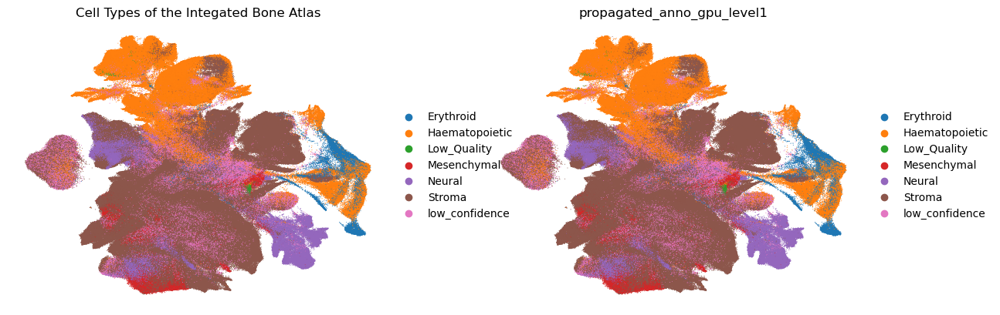

In [9]:
import scanpy as sc

sc.pl.umap(
    adata, 
    color=['propagated_anno_knn_level1', 'propagated_anno_gpu_level1'],
    size=2,               # Increase point size for better visibility
    legend_loc='right margin',  # Or 'right margin' if you want a separate legend
    frameon=False,
    title='Cell Types of the Integated Bone Atlas'
              # High resolution
)


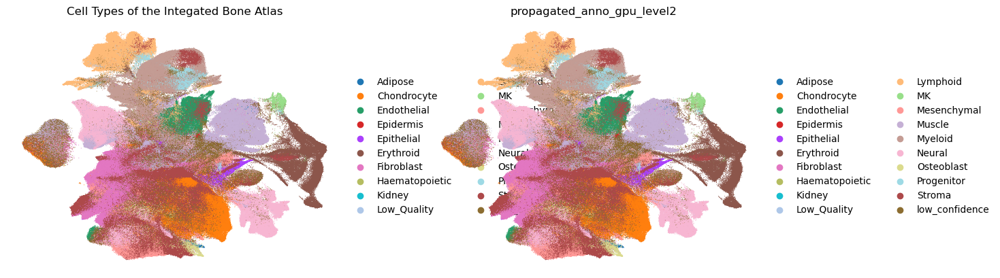

In [11]:
import scanpy as sc

sc.pl.umap(
    adata, 
    color=['propagated_anno_knn_level2','propagated_anno_gpu_level2'], 
    size=2,               # Increase point size for better visibility
    legend_loc='right margin',  # Or 'right margin' if you want a separate legend
    frameon=False,
    title='Cell Types of the Integated Bone Atlas'
              # High resolution
)


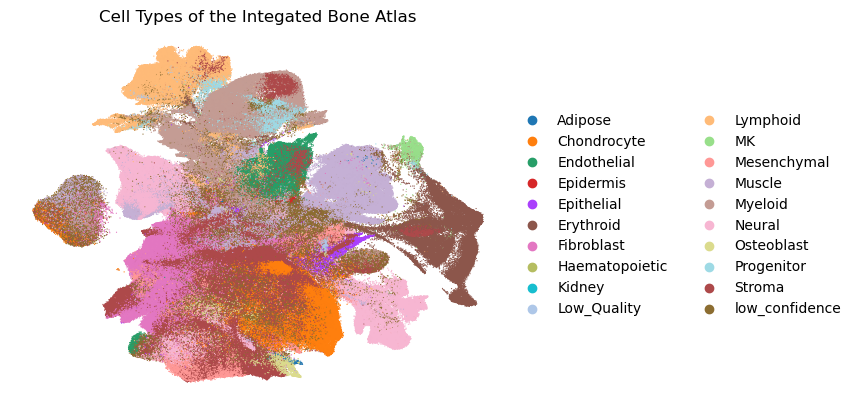

In [12]:
import scanpy as sc

sc.pl.umap(
    adata, 
    color='propagated_anno_knn_level2', 
    size=3,               # Increase point size for better visibility
    legend_loc='right margin',  # Or 'right margin' if you want a separate legend
    frameon=False,
    title='Cell Types of the Integated Bone Atlas'
              # High resolution
)


# Add Chatgpt Derived Manual Annotation 

In [8]:
import json
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact
import importlib, annotation
importlib.reload(annotation)
from annotation import (
    annotate_broad_topN,      # automatic broad annotation per cluster using marker enrichment
    extract_topN_from_rgg,    # extract top-N DEGs per cluster from scanpy rank_genes_groups
    top_genes_for_cluster,    # return DEGs for one cluster (table or list)
    attach_broad_annotations  # attach a manual/auto cluster→broad label mapping to adata.obs
)
# ---- Load your broad markers built from the uploaded CSV ----
# (this is the file we created earlier when you said "use this!")
BROAD_MARKERS_PATH = "/nfs/team298/sm54/BoneAtlasProject/metadata/marker_genes/BroadCategory_to_Genes.FROM_CSV.EXACT.json"

def load_category_markers(path=BROAD_MARKERS_PATH):
    with open(path) as f:
        m = json.load(f)
    # Coerce to SETS of UPPERCASE symbols for reliable set ops
    m = {str(k): {str(g).upper() for g in v} for k, v in m.items()}
    return m

CATEGORY_MARKERS = load_category_markers()

In [9]:
# (A) Load markers (already done above)
CATEGORY_MARKERS = load_category_markers()

# (B) Auto-annotate from top-N DEGs per cluster
labels_auto, scores = annotate_broad_topN(
    adata,
    CATEGORY_MARKERS=CATEGORY_MARKERS,
    cluster_key="leiden_res_3",
    deg_key="rank_genes_groups",
    top_n=100,
    min_lfc=0.25,
    max_padj=0.05,
    min_overlap=2,
    prefer_weighted=True,
    up_only=True,
    background="markers"    # or "var"
)


# cluster_to_broad = { '0':'Muscle', '1':'Neural', ... }  # <- paste your dict
attach_broad_annotations(adata, labels_auto, cluster_key="leiden_res_3", out_key="Manual_Anno_ChatGPT")
attach_broad_annotations(adata_full, labels_auto, cluster_key="leiden_res_3", out_key="Manual_Anno_ChatGPT")


/nfs/team298/sm54/BoneAtlasProject/src/annotation/annotation.py:347: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  .sort_values(by=cluster_key, key=lambda s: pd.to_numeric(s, errors="ignore")))
/nfs/team298/sm54/BoneAtlasProject/src/annotation/annotation.py:347: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  .sort_values(by=cluster_key, key=lambda s: pd.to_numeric(s, errors="ignore")))


In [10]:
adata.obs['leiden_res_3']= adata.obs['leiden_res_3'].astype(str)
adata.obs['leiden_res_3'] = adata.obs['leiden_res_3'].astype(str).astype('category')


# Add leiden clustering derived Annotations in 3_annotate_bone_atlas

In [11]:
adata_full.obs['fig_3_4'].value_counts()

fig_3_4
Chondrocyte                                                         175228
Mesenchymal                                                         127701
Osteochondral Progenitor                                             95392
Chondrocyte (low quality)                                            94332
Fibroblast                                                           80522
Neural (schwann)                                                     78898
Muscle                                                               57913
Endothelial                                                          56942
Fibroblast (Meningeal)                                               50529
Mesenchymal (perichondrial)                                          38699
Muscle (Skeletal)                                                    35318
Lymphoid B lineage (pre_B)                                           32496
Neural (neuron)                                                      32331
Myeloid (Macropha

In [15]:
adata_full.obs['fig_3_4'] = adata_full.obs['leiden_res_3'].astype(str).map(manual_annotation)
adata.obs['fig_3_4'] = adata.obs['leiden_res_3'].astype(str).map(manual_annotation)


In [16]:
#adata_full.obs['fig_3_4'].value_counts()

# Broader Categorisation for UMAP Visualisation  

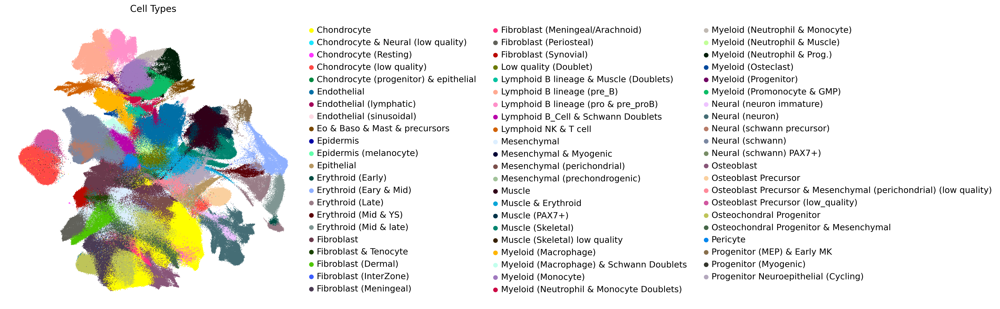

In [17]:
sc.settings.set_figure_params(figsize=(8, 8), dpi=100)  # adjust as needed

sc.pl.umap(
    adata_full,
    color=["fig_3_4"],
    size=3,   
    groups=[],
    # Increase point size for better visibility
    legend_loc='right margin',  # Or 'right margin' if you want a separate legend
    frameon=False,
    title='Cell Types',
              # High resolution
)


## create broader categories 

In [18]:
(list(adata_full.obs['fig_3_4'].unique()))

['Erythroid (Late)',
 'Muscle & Erythroid',
 'Progenitor Neuroepithelial (Cycling)',
 'Osteoblast Precursor & Mesenchymal (perichondrial) (low quality)',
 'Erythroid (Mid & YS)',
 'Osteoblast Precursor (low_quality)',
 'Myeloid (Neutrophil & Muscle)',
 'Osteoblast Precursor',
 'Muscle (Skeletal) low quality',
 'Osteochondral Progenitor',
 'Myeloid (Macrophage)',
 'Fibroblast',
 'Endothelial',
 'Fibroblast (Meningeal/Arachnoid)',
 'Epithelial',
 'Chondrocyte',
 'Fibroblast (Meningeal)',
 'Fibroblast (Periosteal)',
 'Mesenchymal (perichondrial)',
 'Mesenchymal',
 'Neural (schwann)',
 'Epidermis (melanocyte)',
 'Pericyte',
 'Progenitor (MEP) & Early MK',
 'Myeloid (Macrophage) & Schwann Doublets',
 'Lymphoid B_Cell & Schwann Doublets',
 'Neural (schwann precursor)',
 'Fibroblast (Dermal)',
 'Endothelial (lymphatic)',
 'Erythroid (Eary & Mid)',
 'Progenitor (Myogenic)',
 'Low quality (Doublet)',
 'Lymphoid NK & T cell',
 'Osteochondral Progenitor & Mesenchymal',
 'Chondrocyte (low quality)

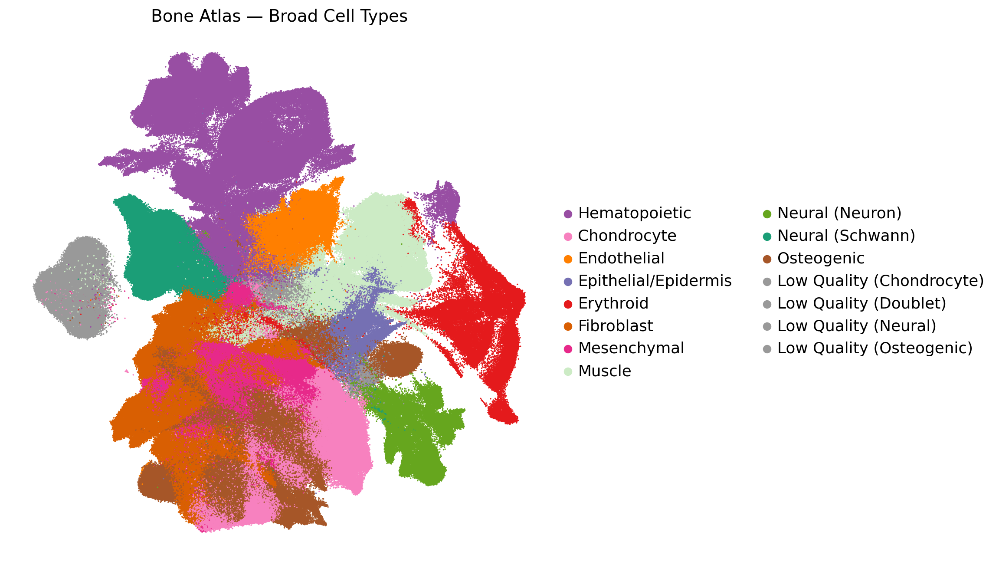

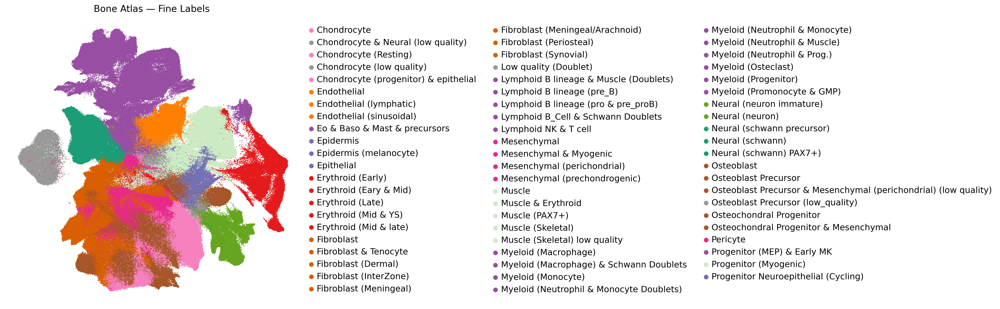

In [19]:
import re
import pandas as pd
import scanpy as sc

# --- 0) Your fine labels are already in `adata_full.obs['fig_3_4']` ---
# Make sure it's categorical (helps with stable legend order)
adata_full.obs['fig_3_4'] = adata_full.obs['fig_3_4'].astype('category')

# --- 1) Updated broad mapping (with your requested changes) ---
# Notes:
# - Pericyte -> Mesenchymal
# - Mixed/doublets reassigned as you asked
# - All *Prog* and explicit progenitors unified under 'Progenitor'
explicit_broad_map = {
    # Erythroid
    'Erythroid (Early)': 'Erythroid',
    'Erythroid (Eary & Mid)': 'Erythroid',
    'Erythroid (Mid & YS)': 'Erythroid',
    'Erythroid (Mid & late)': 'Erythroid',
    'Erythroid (Late)': 'Erythroid',
    # Progenitor / MK / mixed-Prog
    'Progenitor (MEP) & Early MK': 'Hematopoietic',  # your requested label

    # Myeloid (true myeloid)
    'Myeloid (Monocyte)': 'Hematopoietic',
    'Myeloid (Macrophage)': 'Hematopoietic',
    'Myeloid (Progenitor)': 'Hematopoietic',  # optional: treat as Progenitor to be consistent
    'Myeloid (Osteclast)': 'Hematopoietic',
    'Myeloid (Neutrophil & Monocyte)': 'Hematopoietic',
    'Eo & Baso & Mast & precursors': 'Hematopoietic',
    'Myeloid (Macrophage) & Schwann Doublets': 'Hematopoietic',  # if present
     'Myeloid (Neutrophil & Prog.)': 'Hematopoietic',   # your change
    'Myeloid (Promonocyte & GMP)': 'Hematopoietic',     # your change
    # Lymphoid
    'Lymphoid NK & T cell': 'Hematopoietic',
    'Lymphoid B lineage (pre_B)': 'Hematopoietic',
    'Lymphoid B lineage (pro & pre_proB)': 'Hematopoietic',
    'Lymphoid B_Cell & Schwann Doublets': 'Hematopoietic',     # your change
    'Lymphoid B lineage & Muscle (Doublets)': 'Hematopoietic',  # your change
    # Chondrocyte
    'Chondrocyte': 'Chondrocyte',
    'Chondrocyte (Resting)': 'Chondrocyte',
    'Chondrocyte (low quality)': 'Low Quality (Chondrocyte)',
    'Chondrocyte (progenitor) & epithelial': 'Chondrocyte',
    # Endothelial
    'Endothelial': 'Endothelial',
    'Endothelial (lymphatic)': 'Endothelial',
    'Endothelial (sinusoidal)': 'Endothelial',
    # Mesenchymal (incl. perichondrial, prechondrogenic, pericyte)
    'Mesenchymal': 'Mesenchymal',
    'Mesenchymal (perichondrial)': 'Mesenchymal',
    'Mesenchymal (prechondrogenic) ': 'Mesenchymal',
    'Mesenchymal & Myogenic ': 'Mesenchymal',  # your change
    'Pericyte': 'Mesenchymal',                 # your change
    # Fibroblast
    'Fibroblast': 'Fibroblast',
    'Fibroblast (Dermal)': 'Fibroblast',
    'Fibroblast (Periosteal)': 'Fibroblast',
    'Fibroblast (Meningeal)': 'Fibroblast',
    'Fibroblast (Meningeal/Arachnoid)': 'Fibroblast',
    'Fibroblast (Synovial)': 'Fibroblast',
    'Fibroblast (InterZone)': 'Fibroblast',
    'Fibroblast & Tenocyte': 'Fibroblast',
    # Muscle
    'Progenitor (Myogenic)': 'Muscle',
    'Muscle': 'Muscle',
    'Muscle (Skeletal)': 'Muscle',
    'Muscle (PAX7+)': 'Muscle',
    'Muscle (Skeletal) low quality': 'Muscle',
    'Muscle & Erythroid': 'Muscle',  # your change
    # Neural
    'Neural (schwann)': 'Neural (Schwann)',
    'Neural (schwann) PAX7+)': 'Neural (Schwann)',
    'Neural (schwann precursor)': 'Neural (Schwann)',
    'Neural (neuron)': 'Neural (Neuron)',
    'Neural (neuron immature)': 'Neural (Neuron)',
    # Osteogenic
    'Osteoblast': 'Osteogenic',
    'Osteoblast Precursor': 'Osteogenic',
    'Osteoblast Precursor (low_quality)': 'Low Quality (Osteogenic)',
    'Osteochondral Progenitor': 'Osteogenic',
    'Osteochondral Progenitor & Mesenchymal': 'Osteogenic',
    'Osteoblast Precursor & Mesenchymal (perichondrial) (low quality)': 'Osteogenic',
    # Epithelial / Epidermis
    'Progenitor Neuroepithelial (Cycling)': 'Epithelial/Epidermis',
    'Epithelial': 'Epithelial/Epidermis',
    'Epidermis': 'Epithelial/Epidermis',
    'Epidermis (melanocyte)': 'Epithelial/Epidermis',
    # Low Quality (as requested)
    'Low quality (Doublet)': 'Low Quality (Doublet)',
    'Chondrocyte & Neural (low quality)': 'Low Quality (Neural)',
}

# Optional pattern rule: anything containing 'Progenitor' or 'Prog' goes to 'Progenitor'
# unless explicitly assigned above (e.g., 'Prog & MK').
def assign_major(label: str) -> str:
    if label in explicit_broad_map:
        return explicit_broad_map[label]
    if re.search(r'\bProg|\bProgenitor', label):
        return 'Progenitor'
    # sensible defaults by substring
    subs = {
        'Erythroid': 'Erythroid',
        'Myeloid': 'Hematopoietic',
        'Lymphoid': 'Hematopoietic',
        'Chondrocyte': 'Chondrocyte',
        'Endothelial': 'Endothelial',
        'Osteo': 'Osteogenic',
        'Mesenchymal': 'Mesenchymal',
        'Fibroblast': 'Fibroblast',
        'Muscle': 'Muscle',
        'Neural': 'Neural',
        'Epithelial': 'Epithelial/Epidermis',
        'Epidermis': 'Epithelial/Epidermis',
        'Pericyte': 'Mesenchymal',
        'Doublet': 'Low Quality',
        'low quality': 'Low Quality',
    }
    for k, v in subs.items():
        if k in label:
            return v
    return 'Other'

cats = list(adata_full.obs['fig_3_4'].cat.categories)
major_series = adata_full.obs['fig_3_4'].astype(str).map(assign_major)
adata_full.obs['major_celltype_manual'] = pd.Categorical(major_series)

# --- 2) Colours: one colour per broad family (Progenitor unified) ---
major_palette = {
    'Erythroid': '#e41a1c',            # strong red
    #'Prog Erythroid & MK': '#377eb8',            # bold blue
    'Hematopoietic': '#984ea3',             # purple
    'Endothelial': '#ff7f00',          # vivid orange
    'Osteogenic': '#a65628',           # chestnut brown
    'Chondrocyte': '#f781bf',          # pink 
    'Mesenchymal': '#e7298a',          #hot pink/magenta
    'Fibroblast': '#d95f02',           # burnt orange
    'Muscle': '#CCEBC5',               # mint 
    'Neural (Neuron)': '#66a61e',               # strong leaf green
    'Epithelial/Epidermis': '#7570b3', # indigo
    'Low Quality (Doublet)': '#999999',          # grey (reserved only here)
    'Low Quality (Neural)': '#999999',          # grey (reserved only here)
    'Low Quality (Chondrocyte)': '#999999',          # grey (reserved only here)
    'Low Quality (Osteogenic)': '#999999',          # grey (reserved only here)

    'Other': '#000000' ,                # fallback black
    'Neural (Schwann)': '#1B9E77'
}


# Attach colours for the major plot
majors_in_data = list(adata_full.obs['major_celltype_manual'].cat.categories)
adata_full.uns['major_celltype_manual_colors'] = [major_palette.get(m, '#000000') for m in majors_in_data]

# --- 3) Harmonise colours for the fine labels by their major family ---
fine_to_colour = {}
for c in cats:
    maj = assign_major(c)
    fine_to_colour[c] = major_palette.get(maj, '#000000')

adata_full.uns['fig_3_4_colors'] = [fine_to_colour[c] for c in cats]

# (Optional) Order major categories in a biologically readable order
major_order = [
     'Hematopoietic',
    'Chondrocyte',
    'Endothelial', 
    'Epithelial/Epidermis',
    'Erythroid',
    'Fibroblast',
    'Mesenchymal', 
    'Muscle', 
    'Neural (Neuron)',
    'Neural (Schwann)',
    'Osteogenic',
    'Low Quality (Chondrocyte)',
    'Low Quality (Doublet)',
      'Low Quality (Neural)',
     'Low Quality (Osteogenic)',
    'Other'
]
present_order = [m for m in major_order if m in majors_in_data]
adata_full.obs['major_celltype_manual'] = adata_full.obs['major_celltype_manual'].cat.reorder_categories(present_order, ordered=True)
adata_full.uns['major_celltype_manual_colors'] = [major_palette[m] for m in present_order]

# --- 4) Plot UMAPs ---
sc.pl.umap(
    adata_full,
    color='major_celltype_manual',
    size=6,
    legend_loc='right margin',
    frameon=False,
    title='Bone Atlas — Broad Cell Types',
    save='_major_celltypes.png',
)

sc.pl.umap(
    adata_full,
    color='fig_3_4',
    size=6,
    legend_loc='right margin',
    frameon=False,
    title='Bone Atlas — Fine Labels ',
    save='_fine_grouped.png',
)

# # (Optional) Also create a short label (no parentheses) but KEEP existing category order
# short = adata_full.obs['fig_3_4'].astype(str).str.replace(r"\s*\(.*?\)", "", regex=True)
# adata_full.obs['fig_3_4_short'] = pd.Categorical(short, categories=cats, ordered=True)


# Dotplots and UMAP for visualisation 

In [20]:
marker_dictionary2 = {
  "Haematopeotic":       ["PTPRC"],
    "Chondrocyte":        ["SOX9", "COL2A1", "ACAN", "HAPLN1", "COL9A1"],
     "Endothelial":        ["PECAM1", "KDR", "CDH5", "ESAM", "CLDN5"],
     "Epithelial/Epidermis":      [ "KRT19"],
      "Erythroid":          ["GYPA", "HBZ"],
      "Fibroblast":         ["PDGFRA", "DCN", "LUM", "TWIST2"],
      "Mesenchymal":  ["MEIS1","MEIS2","MEIS3", "PRRX1","THBS2"],
  "Muscle":             [ "MYOD1", "DES","ACTA1","PAX7"],
 "Neural (Neuron)":             ["TUBB3", "ELAVL3", "DCX"],
 "Neural (Schwann)":             [ "MBP", "MPZ"],
     "Osteoblast":         ["IBSP",'SPP1', 'IBSP', "RUNX2"],
}

{'mainplot_ax': <Axes: >,
 'gene_group_ax': <Axes: >,
 'size_legend_ax': <Axes: title={'center': 'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <Axes: title={'center': 'Mean expression\nin group'}>}

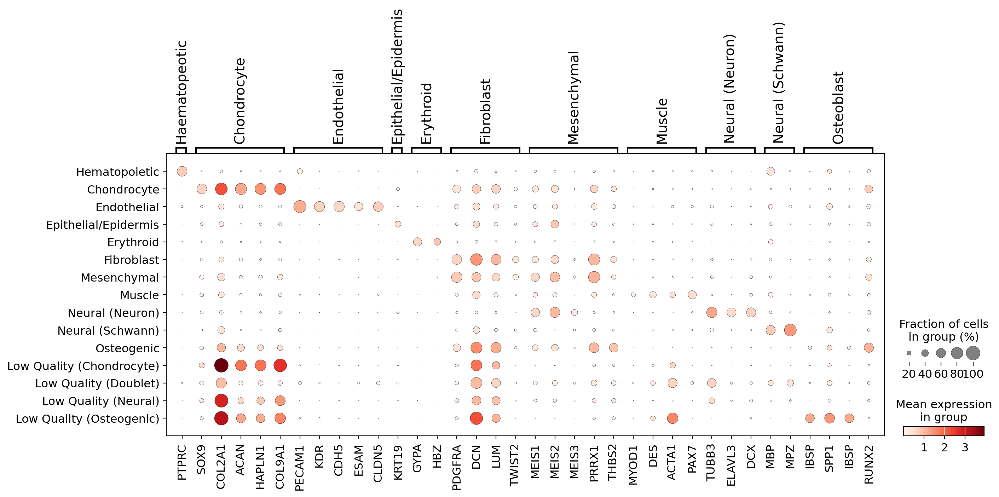

In [21]:
sc.pl.dotplot(
   adata_full,
   marker_dictionary2,
    groupby= "major_celltype_manual",
    dendrogram=False,
    swap_axes=False,
    show=False
)

In [25]:
marker_dictionary2 = {
  "Haematopeotic":       ["LYZ", "CD14", "HLA-DRA", "FCGR3A", "MPO"],
  "Lymphoid_Haem":      ["CD3E", "CD8A", "IL7R", "MS4A1", "CD19"],
  "Progenitor_Haem":    ["CD34", "SPINK2", "GATA2", "FLT3", "MLLT3"],
  "Erythroid":          ["GYPA", "HBE1", "HBZ", "HBA1", "KLF1"],
  "Osteoblast":         ["IBSP", "IFITM5", "BGLAP", "PHOSPHO1", "RUNX2"],
  "Osteoclast_Haem":    ["ACP5", "CTSK", "MMP9", "SIGLEC15", "CD68"],
  "Chondrocyte":        ["SOX9", "COL2A1", "ACAN", "HAPLN1", "COL9A1"],
  "Mesenchymal cells":  ["PDGFRA", "PDPN", "PRRX1", "RGS5", "TAGLN",'HOXD13','LHX2','ISL1'],
  "Adipose":            ["APOE", "LPL", "CXCL12", "GAS6", "C1QTNF3"],
  "Muscle":             ["ACTA2", "MYOD1", "MYF5", "TNNT3", "DES"],
  "Endothelial":        ["PECAM1", "KDR", "CDH5", "ESAM", "CLDN5"],
  "Epithelial":         ["EPCAM", "CDH1", "KRT8", "KRT18", "KRT19"],
  "Epidermis":          ["KRT5", "KRT14", "KRT15", "PMEL", "TYR"],
  "Neural":             ["SOX2", "NES", "DCX", "ELAVL3", "TUBB3"],
  "Fibroblast":         ["PDGFRA", "DCN", "LUM", "TWIST2"],
  "Stroma":             ["CCL19", "CCL21", "CXCL13", "LUM", "DCN"],
      "Neural":             ["TUBB3", "SOX2", "NES"],
}

In [26]:
ann_groups = {
    # Erythroid
    'Erythroid (Early)': 'Erythroid',
    'Erythroid (Eary & Mid)': 'Erythroid',
    'Erythroid (Mid & YS)': 'Erythroid',
    'Erythroid (Mid & late)': 'Erythroid',
    'Erythroid (Late)': 'Erythroid',
    # Progenitor / MK / mixed-Prog
    'Progenitor (MEP) & Early MK': 'Progenitor',  # your requested label

    # Myeloid (true myeloid)
    'Myeloid (Monocyte)': 'Myeloid',
    'Myeloid (Macrophage)': 'Myeloid',
    'Myeloid (Progenitor)': 'Progenitor',  # optional: treat as Progenitor to be consistent
    'Myeloid (Osteclast)': 'Myeloid',
    'Myeloid (Neutrophil & Monocyte)': 'Myeloid',
    'Eo & Baso & Mast & precursors': 'Progenitor',
    'Myeloid (Macrophage) & Schwann Doublets': 'Myeloid',  # if present
     'Myeloid (Neutrophil & Prog.)': 'Myeloid',   # your change
    'Myeloid (Promonocyte & GMP)': 'Progenitor',     # your change
    # Lymphoid
    'Lymphoid NK & T cell': 'Lymphoid',
    'Lymphoid B lineage (pre_B)': 'Lymphoid',
    'Lymphoid B lineage (pro & pre_proB)': 'Lymphoid',
    'Lymphoid B_Cell & Schwann Doublets': 'Lymphoid',     # your change
    'Lymphoid B lineage & Muscle (Doublets)': 'Lymphoid',  # your change
    # Chondrocyte
    'Chondrocyte': 'Chondrocyte',
    'Chondrocyte (Resting)': 'Chondrocyte',
    'Chondrocyte (low quality)': 'Low Quality (Chondrocyte)',
    'Chondrocyte (progenitor) & epithelial': 'Chondrocyte',
    # Endothelial
    'Endothelial': 'Endothelial',
    'Endothelial (lymphatic)': 'Endothelial',
    'Endothelial (sinusoidal)': 'Endothelial',
    # Mesenchymal (incl. perichondrial, prechondrogenic, pericyte)
    'Mesenchymal': 'Mesenchymal',
    'Mesenchymal (perichondrial)': 'Mesenchymal',
    'Mesenchymal (prechondrogenic) ': 'Mesenchymal',
    'Mesenchymal & Myogenic ': 'Mesenchymal',  # your change
    'Pericyte': 'Mesenchymal',                 # your change
    # Fibroblast
    'Fibroblast': 'Fibroblast',
    'Fibroblast (Dermal)': 'Fibroblast',
    'Fibroblast (Periosteal)': 'Fibroblast',
    'Fibroblast (Meningeal)': 'Fibroblast',
    'Fibroblast (Meningeal/Arachnoid)': 'Fibroblast',
    'Fibroblast (Synovial)': 'Fibroblast',
    'Fibroblast (InterZone)': 'Fibroblast',
    'Fibroblast & Tenocyte': 'Fibroblast',
    # Muscle
    'Progenitor (Myogenic)': 'Muscle',
    'Muscle': 'Muscle',
    'Muscle (Skeletal)': 'Muscle',
    'Muscle (PAX7+)': 'Muscle',
    'Muscle (Skeletal) low quality': 'Muscle',
    'Muscle & Erythroid': 'Muscle',  # your change
    # Neural
    'Neural (schwann)': 'Neural',
    'Neural (schwann) PAX7+)': 'Neural',
    'Neural (schwann precursor)': 'Neural',
    'Neural (neuron)': 'Neural',
    'Neural (neuron immature)': 'Neural',
    # Osteogenic
    'Osteoblast': 'Osteogenic',
    'Osteoblast Precursor': 'Osteogenic',
    'Osteoblast Precursor (low_quality)': 'Osteogenic',
    'Osteochondral Progenitor': 'Osteogenic',
    'Osteochondral Progenitor & Mesenchymal': 'Osteogenic',
    'Osteoblast Precursor & Mesenchymal (perichondrial) (low quality)': 'Osteogenic',
    # Epithelial / Epidermis
    'Progenitor Neuroepithelial (Cycling)': 'Epithelial/Epidermis',
    'Epithelial': 'Epithelial/Epidermis',
    'Epidermis': 'Epithelial/Epidermis',
    'Epidermis (melanocyte)': 'Epithelial/Epidermis',
    # Low Quality (as requested)
    'Low quality (Doublet)': 'Low Quality',
    'Chondrocyte & Neural (low quality)': 'Low Quality',
}


In [27]:
# save to JSON
with open("/nfs/team298/sm54/BoneAtlasProject/metadata/cell_metadata/ann_groups.json", "w") as f:
    json.dump(ann_groups, f, indent=4)

# Extract Haematopoeitic cells first 

4 criteria: 
1) cell typist annotations (majority_voting_Level1)  
2) my own manual annotations (fig_3_4)
3) the module score  HSCs + immune 
4) published annotations + those propagated (propagated_anno_knn_level1) 

In [29]:
majority_voting_Level1= adata_full[adata_full.obs['majority_voting_Level1'].isin(['Haematopoietic','Erythroid'])].copy()
manual_annotation= adata_full[adata_full.obs['major_celltype_manual'].isin(['Hematopoietic','Erythroid'])].copy()
module_scores= sc.read_h5ad('/lustre/scratch124/cellgen/haniffa/users/sm54/data/Bone_Atlas/haem_compartment/tmp_version_subset.h5ad')
module_scores2= adata_full[adata_full.obs_names.isin(module_scores.obs_names)].copy()
published_anno= adata_full[adata_full.obs['propagated_anno_knn_level1'].isin(['Haematopoietic','Erythroid'])].copy()

# Save Final Haematopoetic Object 

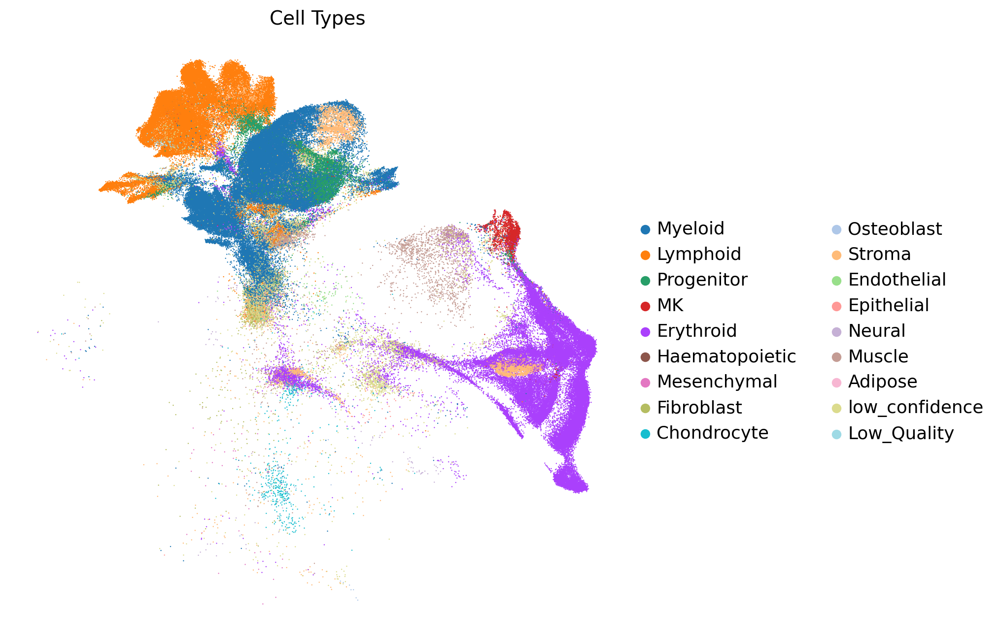

In [30]:
sc.settings.set_figure_params(figsize=(8, 8), dpi=100)  # adjust as needed

sc.pl.umap(
    module_scores2,
    color=["propagated_anno_knn_level2"],
    size=3,   
    groups=[],
    # Increase point size for better visibility
    legend_loc='right margin',  # Or 'right margin' if you want a separate legend
    frameon=False,
    title='Cell Types',
              # High resolution
)


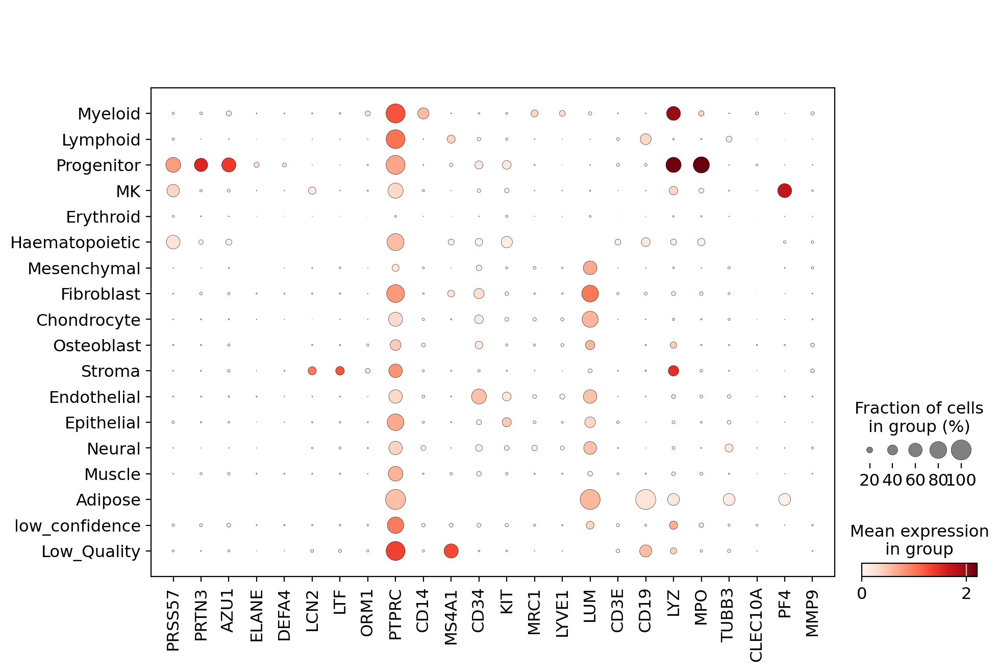

In [31]:
sc.pl.dotplot(module_scores2,["PRSS57",	"PRTN3",	"AZU1","ELANE",	"DEFA4",	"LCN2",	"LTF",	"ORM1",'PTPRC',"CD14","MS4A1","CD34","KIT","MRC1","LYVE1","LUM","CD3E","CD19","LYZ","MPO","TUBB3","CLEC10A","PF4","MMP9"], groupby='propagated_anno_knn_level2')

In [33]:
# Get the cell sets (obs_names) for each filter
cells_module   = set(module_scores2.obs_names)
cells_majority = set(majority_voting_Level1.obs_names)
cells_manual   = set(manual_annotation.obs_names)
cells_pub      = set(published_anno.obs_names)

# Intersection of all four
common_cells = cells_module & cells_majority & cells_manual & cells_pub

# Extract from adata_full
adata_intersection = adata_full[adata_full.obs_names.isin(common_cells)].copy()

print(f"Number of intersected cells: {adata_intersection.n_obs}")


Number of intersected cells: 156808


In [34]:
# Get the cell sets (obs_names) for each filter
cells_module   = set(module_scores2.obs_names)
cells_majority = set(majority_voting_Level1.obs_names)
cells_manual   = set(manual_annotation.obs_names)
cells_pub      = set(published_anno.obs_names)

# Union of all four
union_cells = cells_module | cells_majority | cells_manual | cells_pub

# Extract from adata_full
adata_union = adata_full[adata_full.obs_names.isin(union_cells)].copy()

print(f"Number of union cells: {adata_union.n_obs}")


Number of union cells: 324028


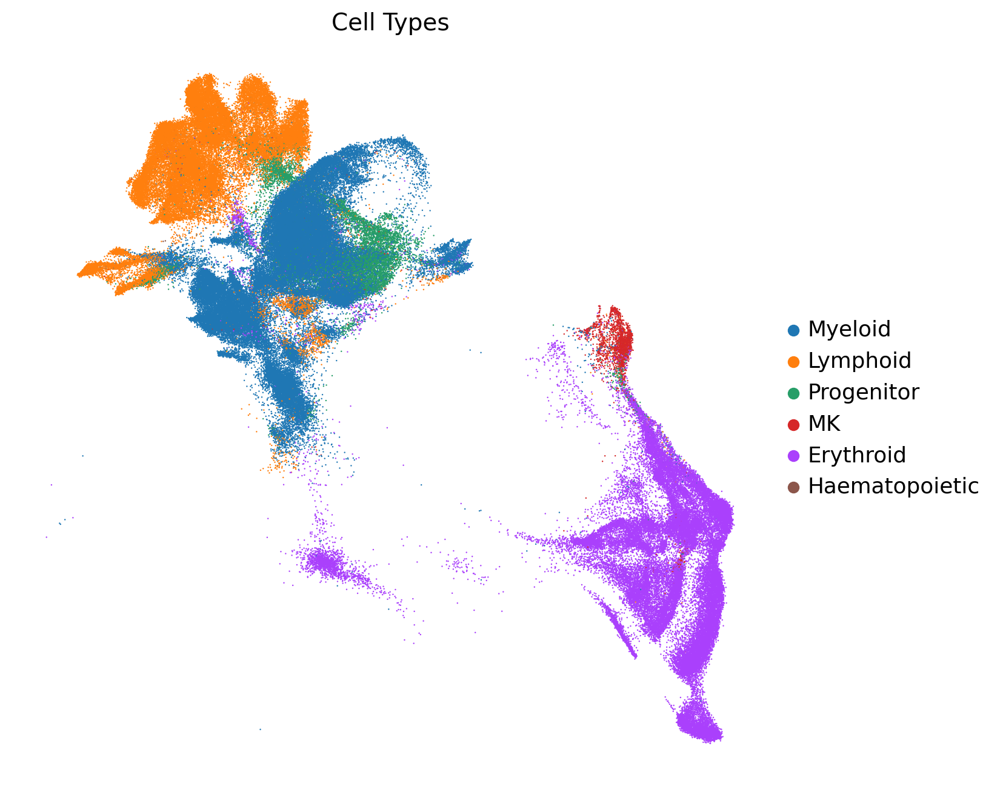

In [35]:
sc.settings.set_figure_params(figsize=(8, 8), dpi=100)  # adjust as needed

sc.pl.umap(
    adata_intersection,
    color=["propagated_anno_knn_level2"],
    size=3,   
    groups=[],
    # Increase point size for better visibility
    legend_loc='right margin',  # Or 'right margin' if you want a separate legend
    frameon=False,
    title='Cell Types',
              # High resolution
)


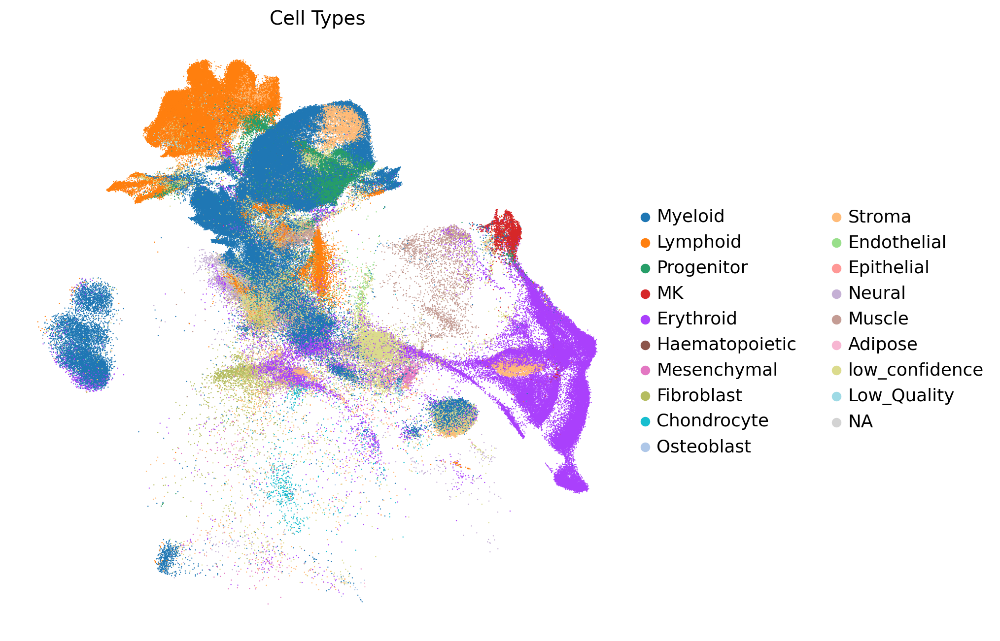

In [36]:
sc.settings.set_figure_params(figsize=(8, 8), dpi=100)  # adjust as needed

sc.pl.umap(
    adata_union,
    color=["propagated_anno_knn_level2"],
    size=3,   
    groups=[],
    # Increase point size for better visibility
    legend_loc='right margin',  # Or 'right margin' if you want a separate legend
    frameon=False,
    title='Cell Types',
              # High resolution
)


In [37]:
adata_raw= sc.read_h5ad('/lustre/scratch124/cellgen/haniffa/users/sm54/data/Bone_Atlas/bone_atlas_filtered_with_metadata_scvi.h5ad')

In [38]:
adata_raw.X.max()

16584.0

In [40]:
adata_raw

AnnData object with n_obs × n_vars = 1566871 × 36601
    obs: 'barcode_raw', 'Sanger_ID', 'Cell_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'log1p_total_counts_rb', 'pct_counts_rb', 'total_counts_outlier', 'gene_counts_outlier', 'mt_outlier', 'Organ', '10X_Chemistry', 'Accession_ID', 'Age', 'Age(PCW)', 'Dataset', 'Donor_ID', 'FACS_Sorting', 'Anatomical_Site', 'Method', 'Multiplexed', 'Expected_Donors', 'Organism', 'Run_ID', 'Study', 'Technology', 'predicted_labels', 'over_clustering', 'majority_voting', 'predicted_labels_Level1', 'predicted_labels_Level2', 'majority_voting_Level1', 'majority_voting_Level2', 'mt_high_outlier', 'QC', 'scrublet_score_unfiltered', 'predicted_doublets_unfiltered', 'scrublet_cluster_score_unfiltered', 'bh_pval_un

In [41]:
adata_raw.obs['Method'].value_counts()

Method
3GEX            830298
10X_multiome    656384
5GEX             80189
Name: count, dtype: int64

In [42]:
import scanpy as sc

# Subset adata_raw2 to union cells
bone_haem = adata_raw[adata_raw.obs_names.isin(adata_union.obs_names)].copy()

# Build immune_conf column
bone_haem.obs["immune_conf"] = [
    "Yes" if cell in adata_intersection.obs_names else "No"
    for cell in bone_haem.obs_names
]

# Quick check
print(bone_haem.obs["immune_conf"].value_counts())


immune_conf
No     167220
Yes    156808
Name: count, dtype: int64


In [43]:
bone_haem.write_h5ad('/nfs/team298/sm54/BoneAtlasProject/data/bone_haem_compartment/bone_haem_filtered_with_metadata_scvi.h5ad')

In [44]:
list(adata_full.obs['major_celltype_manual'].unique())

['Erythroid',
 'Muscle',
 'Epithelial/Epidermis',
 'Osteogenic',
 'Low Quality (Osteogenic)',
 'Hematopoietic',
 'Fibroblast',
 'Endothelial',
 'Chondrocyte',
 'Mesenchymal',
 'Neural (Schwann)',
 'Low Quality (Doublet)',
 'Low Quality (Chondrocyte)',
 'Neural (Neuron)',
 'Low Quality (Neural)']

In [45]:
# Step 1: keep only cells present in adata_full
adata_raw = adata_raw[adata_raw.obs_names.isin(adata_full.obs_names)].copy()

# Step 2: transfer manual annotation column
adata_raw.obs["major_celltype_manual"] = adata_full.obs["major_celltype_manual"].reindex(
    adata_raw.obs_names
)

In [46]:
import os

# Ensure output directory exists
out_dir = "/nfs/team298/sm54/BoneAtlasProject/data/bone_atlas_anndatas_non_immune"
os.makedirs(out_dir, exist_ok=True)

# Define cell type groups
groups = {
    "Endothelial": ["Endothelial"],
    "Neural": ["Neural (Schwann)", "Neural (Neuron)", "Low Quality (Neural)"],
    "Chondrocytes": ["Chondrocyte", "Low Quality (Chondrocyte)"],
    "Muscle": ["Muscle"],
    "Stroma": ['Epithelial/Epidermis',
        "Fibroblast",
        "Osteogenic",
        "Low Quality (Osteogenic)",
        "Mesenchymal",
        # add any other stromal lineage labels if needed
    ],
}

# Loop over groups, subset, and save
for name, labels in groups.items():
    # Boolean mask for the group
    mask = adata_raw.obs["major_celltype_manual"].isin(labels)
    n_cells = mask.sum()
    if n_cells == 0:
        print(f"[WARN] No cells found for {name} with labels {labels}")
        continue

    # Subset
    subset = adata_raw[mask].copy()

    # Safe filename
    fname_safe = name.lower().replace(" ", "_").replace("(", "").replace(")", "")
    out_path = os.path.join(out_dir, f"bone_{fname_safe}_filtered_with_metadata_scvi.h5ad")

    # Save
    subset.write(out_path)
    print(f"Saved {n_cells} cells -> {out_path}")


Saved 60189 cells -> /nfs/team298/sm54/BoneAtlasProject/data/bone_atlas_anndatas_non_immune/bone_endothelial_filtered_with_metadata_scvi.h5ad
Saved 140204 cells -> /nfs/team298/sm54/BoneAtlasProject/data/bone_atlas_anndatas_non_immune/bone_neural_filtered_with_metadata_scvi.h5ad
Saved 282967 cells -> /nfs/team298/sm54/BoneAtlasProject/data/bone_atlas_anndatas_non_immune/bone_chondrocytes_filtered_with_metadata_scvi.h5ad
Saved 149879 cells -> /nfs/team298/sm54/BoneAtlasProject/data/bone_atlas_anndatas_non_immune/bone_muscle_filtered_with_metadata_scvi.h5ad
Saved 647476 cells -> /nfs/team298/sm54/BoneAtlasProject/data/bone_atlas_anndatas_non_immune/bone_stroma_filtered_with_metadata_scvi.h5ad


In [49]:
60189 + 140204 + 282967 + 149879 + 647476 + 324028

1604743

In [ ]:
bone_haem.obs['leiden_res_3']